# Challenge:

I started with a youtube videos dataset (fakedata) and built a model to predict conversion rate for a given video.

In [46]:
import pandas as pd 
import seaborn as sns
import shap
import matplotlib.pyplot as plt
import numpy as np
import xgboost 
import scipy.stats as stats
from statsmodels.stats.diagnostic import het_breuschpagan
import statsmodels.api as sm
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV, RepeatedKFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
shap.initjs()
print(xgboost.__version__)
# pd.options.display.float_format = '{:.6f}'.format


2.1.3


In [47]:
import importlib.metadata

def generate_requirements(filename="requirements.txt"):
    with open(filename, "w") as file:
        for dist in importlib.metadata.distributions():
            name = dist.metadata["Name"]
            version = dist.metadata["Version"]
            file.write(f"{name}=={version}\n")
    print(f"Requirements written to {filename}")

generate_requirements()

Requirements written to requirements.txt


# Data

In [5]:
df = pd.read_excel('data/data.xlsx')
# dfS = pd.read_csv('sampleS0.csv')

In [6]:
display(df.describe(), df.info(), df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555 entries, 0 to 554
Data columns (total 14 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   channel_id                        555 non-null    object 
 1   video_id                          555 non-null    object 
 2   published_at                      555 non-null    object 
 3   conversions                       555 non-null    int64  
 4   views                             555 non-null    int64  
 5   conversion_rate                   555 non-null    float64
 6   subscribers                       555 non-null    int64  
 7   median_past_views                 555 non-null    float64
 8   median_past_views_per_subscriber  555 non-null    float64
 9   median_past_comments              555 non-null    float64
 10  median_past_comments_per_view     555 non-null    float64
 11  median_past_likes_per_dislike     555 non-null    float64
 12  median_p

,conversions,views,conversion_rate,subscribers,median_past_views,median_past_views_per_subscriber,median_past_comments,median_past_comments_per_view,median_past_likes_per_dislike,median_past_likes_per_view,average_retention
count,555.000000,5.550000e+02,5.550000e+02,5.550000e+02,5.550000e+02,555.000000,555.000000,555.000000,555.000000,555.000000,555.000000
mean,30.363964,2.437169e+05,2.378064e-04,4.803139e+05,2.171908e+05,0.573765,821.039640,0.005827,61.049784,0.056184,1.436291
std,50.753927,6.325628e+05,2.786807e-04,1.235873e+06,4.751657e+05,0.514461,1428.527375,0.004333,43.811195,0.025462,0.290331
min,0.000000,1.860000e+03,1.378822e-09,1.690000e+04,7.953500e+03,0.029898,22.000000,0.000485,6.463500,0.008969,1.020630
25%,4.000000,3.971600e+04,5.538307e-05,1.210000e+05,3.899700e+04,0.254445,213.250000,0.002836,32.399619,0.039574,1.231531
50%,13.000000,9.334700e+04,1.481025e-04,2.110000e+05,8.740350e+04,0.426184,426.000000,0.004760,50.192308,0.053722,1.375579
75%,38.000000,1.988805e+05,3.486914e-04,4.250000e+05,2.015832e+05,0.694209,832.000000,0.007663,74.537672,0.069320,1.528574
max,719.000000,8.896371e+06,1.581244e-03,1.280000e+07,4.691098e+06,3.762094,15769.500000,0.035089,377.738408,0.173569,2.340094


None

,channel_id,video_id,published_at,conversions,views,conversion_rate,subscribers,median_past_views,median_past_views_per_subscriber,median_past_comments,median_past_comments_per_view,median_past_likes_per_dislike,median_past_likes_per_view,average_retention
0,channel_0,video_0,2019-09-28 13:00:00+00:00,64,242887,0.000264,176000,243186.5,1.381741,623.0,0.002165,30.125136,0.026371,1.406284
1,channel_0,video_1,2020-03-07 14:00:10+00:00,35,135413,0.000258,176000,81016.5,0.460321,402.0,0.003693,29.574542,0.038801,1.406284
2,channel_1,video_2,2019-07-26 14:00:00+00:00,41,94210,0.000435,497000,890437.5,1.791625,1969.5,0.002393,28.074815,0.026864,1.259188
3,channel_2,video_3,2019-07-31 07:00:02+00:00,38,69479,0.000547,348000,98262.5,0.282364,275.0,0.004391,22.723902,0.025438,1.295581
4,channel_3,video_4,2020-01-10 16:59:26+00:00,1,96465,0.000010,353000,110008.0,0.311637,660.5,0.006008,40.354157,0.036893,1.175611


In [7]:
df['date'] = pd.to_datetime(df['published_at']).dt.date
df['datetime'] = pd.to_datetime(df['published_at'])
df['days_since_publication'] = (pd.Timestamp.now(tz='UTC') - df['datetime']).dt.days
df['day_of_week'] = df['datetime'].dt.dayofweek
df['month'] = df['datetime'].dt.month
df['is_weekend'] = df['day_of_week'].isin([5, 6]).astype(int)
###
df['views_log'] = np.log1p(df['views'])
df['subscribers_log'] = np.log1p(df['subscribers'])

# Data visualisation

In [8]:
print(df['conversion_rate'].var(),
    df['conversion_rate'].std())

7.766292899137716e-08 0.00027868069361076513


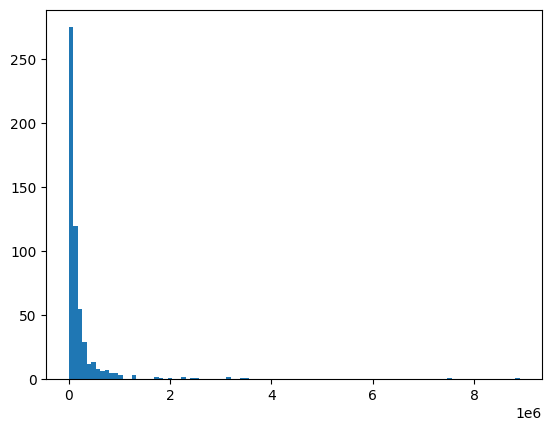

In [9]:
plt.hist(df['views'], bins=100)
plt.show()

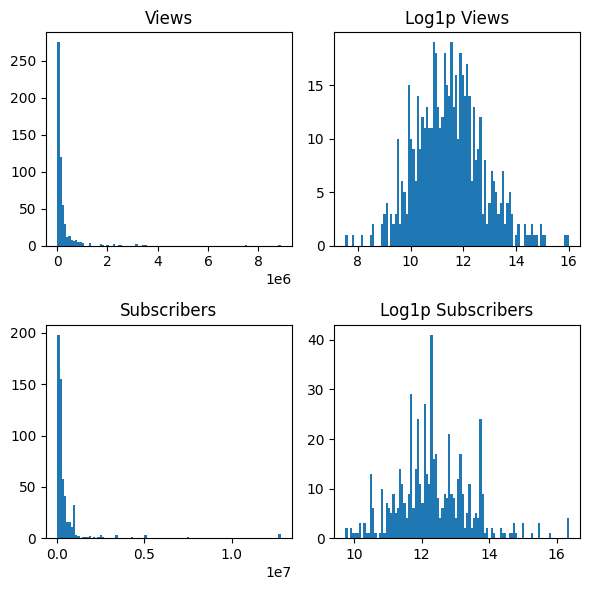

In [10]:
fig, axs = plt.subplots(2, 2, figsize=(6, 6))

axs[0, 0].hist(df['views'], bins=100)
axs[0, 0].set_title('Views')

axs[0, 1].hist(np.log1p(df['views']), bins=100)
axs[0, 1].set_title('Log1p Views')

axs[1, 0].hist(df['subscribers'], bins=100)
axs[1, 0].set_title('Subscribers')

axs[1, 1].hist(np.log1p(df['subscribers']), bins=100)
axs[1, 1].set_title('Log1p Subscribers')

plt.tight_layout()
plt.show()

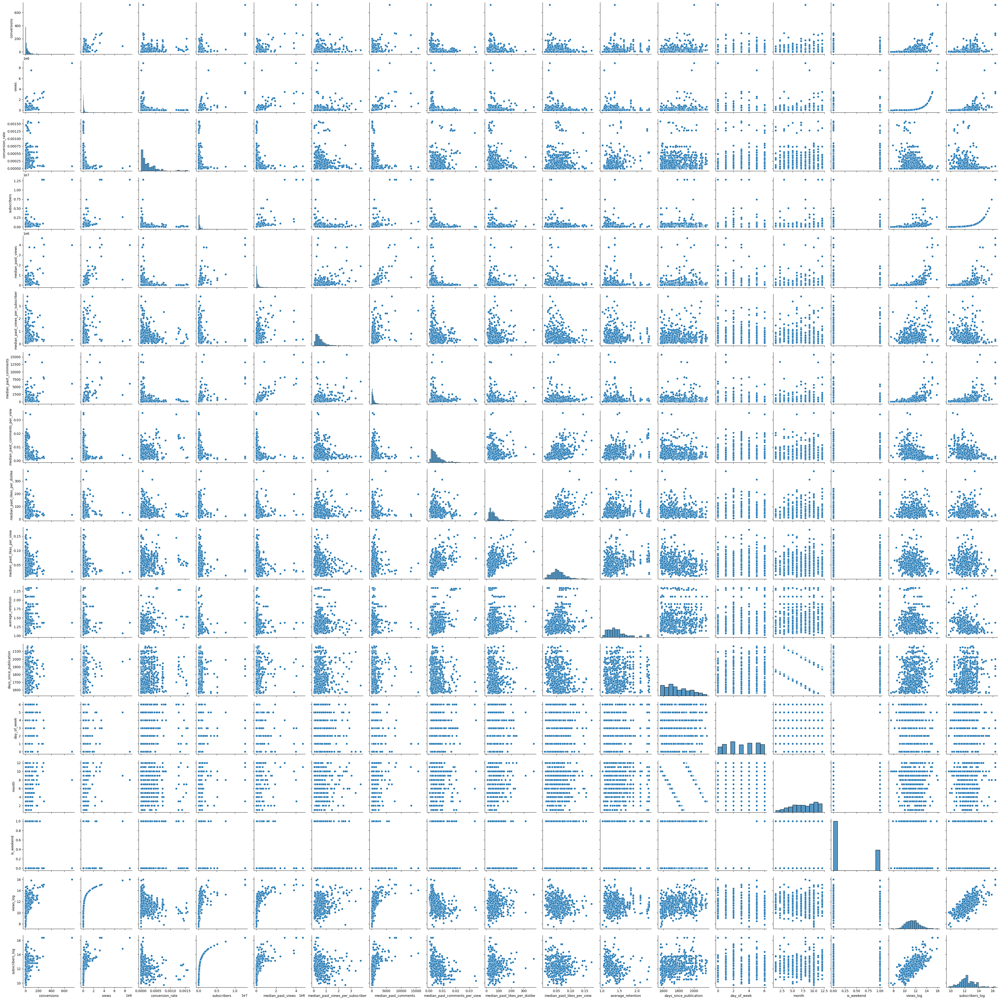

In [11]:
sns.pairplot(df)
plt.show()

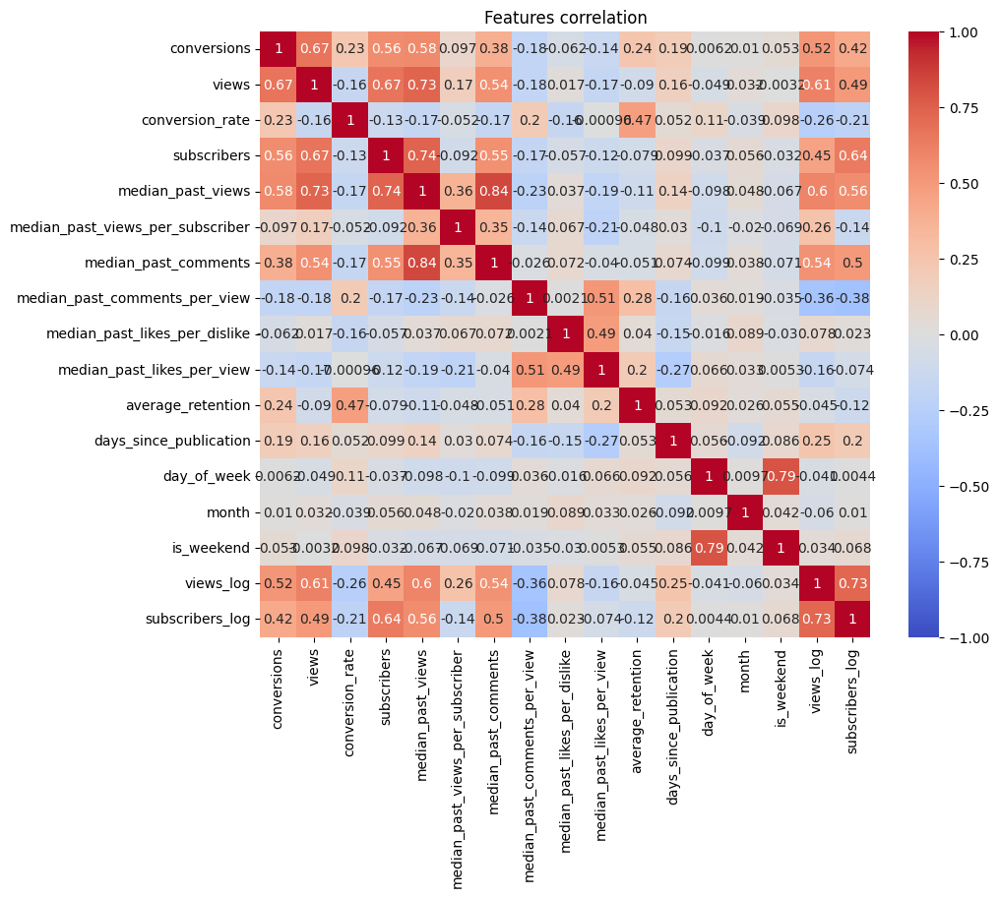

In [12]:
df2 = df.drop(columns=['channel_id', 'video_id', 'published_at', 'date', 'datetime'])
corr_matrix = df2.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Features correlation')
plt.show()

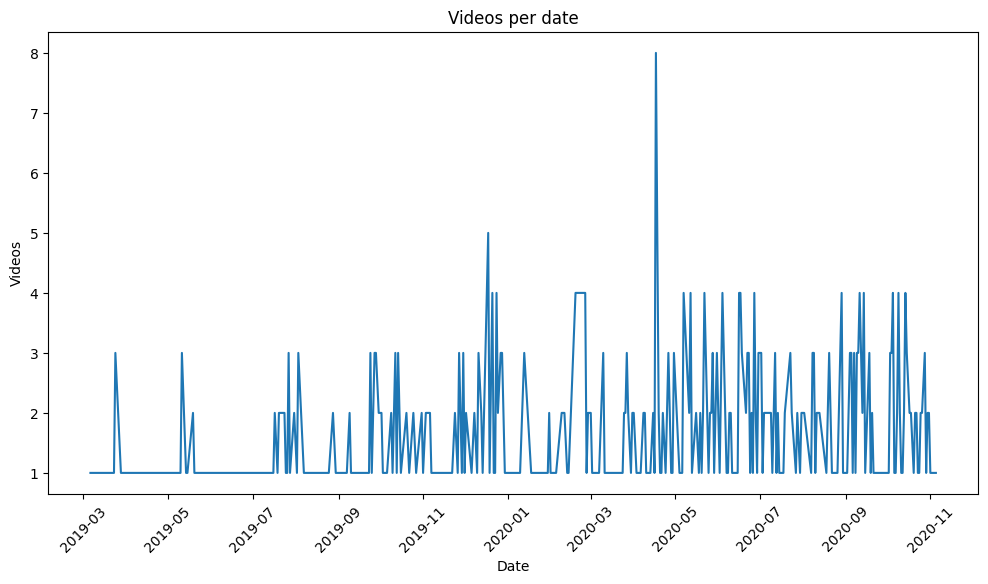

In [13]:
df_plot = df.groupby(df['date']).count()['video_id'].reset_index()
df_plot.columns = ['date', 'video_id_count']

plt.figure(figsize=(12, 6))
sns.lineplot(data=df_plot, x='date', y='video_id_count')
plt.xlabel('Date')
plt.ylabel('Videos')
plt.title('Videos per date')
plt.xticks(rotation=45)
plt.show()

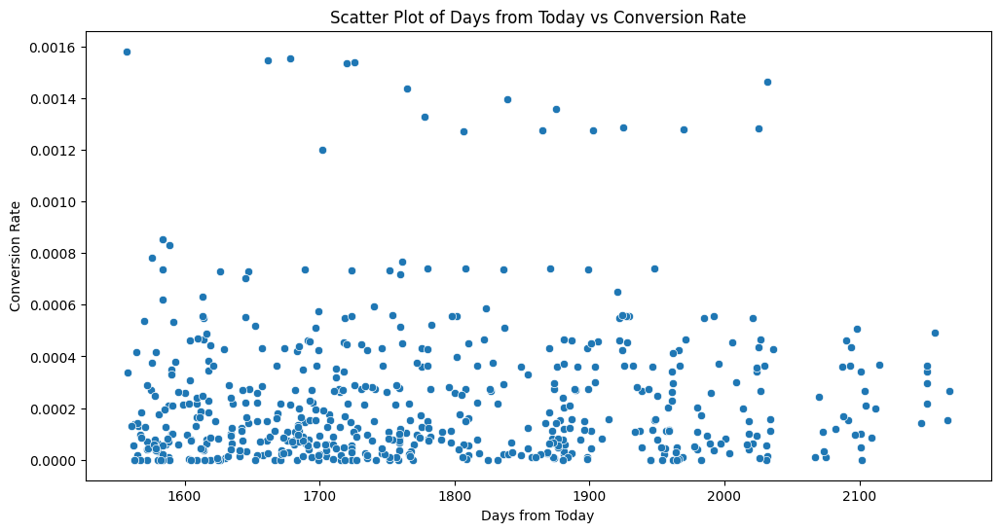

In [14]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='days_since_publication', y='conversion_rate')
plt.xlabel('Days from Today')
plt.ylabel('Conversion Rate')
plt.title('Scatter Plot of Days from Today vs Conversion Rate')
plt.show()

---
# Predict conversion:

## Cross-validation

steps:
- cross validation on different samples to find a sample with less score variance (RMSE and R2)
- grid search to find the best hyperparameters
- Final training with the best sample & parameters

In [15]:
X = df[[
    'days_since_publication', 'day_of_week', 'month', 'is_weekend',
    # 'views', 'subscribers',
    'views_log', 'subscribers_log', 
    'median_past_views', 'median_past_views_per_subscriber', 'median_past_comments',
    'median_past_comments_per_view', 'median_past_likes_per_dislike', 'median_past_likes_per_view', 
    'average_retention']]

y = df['conversion_rate']

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2) 
# seed tested = 1

In [17]:
# Simple linear regression
scaler = StandardScaler()
model0 = LinearRegression()
pipeline = make_pipeline(scaler, model0)

pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)

r2 = pipeline.score(X_test, y_test)
print(f'R2 Score: {r2}')

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'RMSE: {rmse}')

R2 Score: 0.19103970232112255
RMSE: 0.00027768559214804035


# Grid Search

In [18]:
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1],
    'reg_lambda': [0, 0.1, 1], # L2
    'n_estimators': [100, 200, 500]
}

grid_search = GridSearchCV(
    estimator = CatBoostRegressor(eval_metric = 'RMSE'),
    param_grid = param_grid,
    cv=10,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1,
    verbose = 1
)

grid_search.fit(X_train, y_train)
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best RMSE score: {np.absolute(grid_search.best_score_)}")

Fitting 10 folds for each of 81 candidates, totalling 810 fits
0:	learn: 0.0002765	total: 59.6ms	remaining: 5.9s
0:	learn: 0.0002713	total: 60.3ms	remaining: 5.97s
0:	learn: 0.0002619	total: 59.6ms	remaining: 5.9s
0:	learn: 0.0002714	total: 59.8ms	remaining: 5.92s
0:	learn: 0.0002714	total: 60.2ms	remaining: 5.96s
0:	learn: 0.0002699	total: 60.5ms	remaining: 5.99s
0:	learn: 0.0002554	total: 59.6ms	remaining: 5.91s
0:	learn: 0.0002745	total: 59.7ms	remaining: 5.91s
1:	learn: 0.0002757	total: 60ms	remaining: 2.94s
1:	learn: 0.0002703	total: 60.3ms	remaining: 2.96s
1:	learn: 0.0002708	total: 60.8ms	remaining: 2.98s
1:	learn: 0.0002547	total: 60ms	remaining: 2.94s
1:	learn: 0.0002706	total: 60.8ms	remaining: 2.98s
1:	learn: 0.0002738	total: 60.1ms	remaining: 2.94s
2:	learn: 0.0002750	total: 60.3ms	remaining: 1.95s
0:	learn: 0.0002739	total: 59.7ms	remaining: 5.91s
0:	learn: 0.0002656	total: 59.7ms	remaining: 5.91s
1:	learn: 0.0002688	total: 61.1ms	remaining: 3s
2:	learn: 0.0002699	total: 6

# Final training set with optimized parameters, 

In [19]:
model_final = CatBoostRegressor(
    reg_lambda = grid_search.best_params_['reg_lambda'],
    learning_rate = grid_search.best_params_['learning_rate'],
    depth = grid_search.best_params_['max_depth'],
    n_estimators = grid_search.best_params_['n_estimators'],
    eval_metric = 'RMSE',
    # verbose=100
)

kf = KFold(n_splits=10, shuffle=True)

### Cross-validation

In [20]:
rmse_scores = cross_val_score(model_final, X, y, cv=kf, scoring='neg_root_mean_squared_error', verbose=3)
r2_scores = cross_val_score(model_final, X, y, cv=kf, scoring='r2', verbose=3)

print(f'''
    RMSE Mean: {np.mean(np.absolute(rmse_scores))}
    R2 Mean: {np.mean(r2_scores)}
    ''')

0:	learn: 0.0002696	total: 1.4ms	remaining: 697ms
1:	learn: 0.0002634	total: 1.96ms	remaining: 488ms
2:	learn: 0.0002573	total: 2.42ms	remaining: 402ms
3:	learn: 0.0002531	total: 2.78ms	remaining: 345ms
4:	learn: 0.0002488	total: 3.76ms	remaining: 372ms
5:	learn: 0.0002415	total: 4.18ms	remaining: 344ms
6:	learn: 0.0002363	total: 4.63ms	remaining: 326ms
7:	learn: 0.0002315	total: 4.99ms	remaining: 307ms
8:	learn: 0.0002272	total: 5.39ms	remaining: 294ms
9:	learn: 0.0002248	total: 5.83ms	remaining: 286ms
10:	learn: 0.0002204	total: 6.21ms	remaining: 276ms
11:	learn: 0.0002175	total: 7.13ms	remaining: 290ms
12:	learn: 0.0002144	total: 7.53ms	remaining: 282ms
13:	learn: 0.0002096	total: 7.89ms	remaining: 274ms
14:	learn: 0.0002047	total: 8.32ms	remaining: 269ms
15:	learn: 0.0002020	total: 8.74ms	remaining: 264ms
16:	learn: 0.0001993	total: 9.07ms	remaining: 258ms
17:	learn: 0.0001956	total: 9.51ms	remaining: 255ms
18:	learn: 0.0001935	total: 9.9ms	remaining: 251ms
19:	learn: 0.0001909	tot

### Final test

In [21]:
model_final.fit(
    X_train,
    y_train,
    eval_set=(X_test, y_test),
    use_best_model=True,  # save best iteration
    early_stopping_rounds=10,  # save computation time
    plot=True
)

print(f"Model accuracy: {model_final.score(X_test, y_test)}")
# 0.5055420183623227

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.0002638	test: 0.0003042	best: 0.0003042 (0)	total: 490us	remaining: 245ms
1:	learn: 0.0002577	test: 0.0002993	best: 0.0002993 (1)	total: 932us	remaining: 232ms
2:	learn: 0.0002510	test: 0.0002938	best: 0.0002938 (2)	total: 1.27ms	remaining: 210ms
3:	learn: 0.0002452	test: 0.0002908	best: 0.0002908 (3)	total: 3.74ms	remaining: 464ms
4:	learn: 0.0002400	test: 0.0002893	best: 0.0002893 (4)	total: 7.09ms	remaining: 702ms
5:	learn: 0.0002355	test: 0.0002878	best: 0.0002878 (5)	total: 7.56ms	remaining: 623ms
6:	learn: 0.0002306	test: 0.0002871	best: 0.0002871 (6)	total: 8.95ms	remaining: 631ms
7:	learn: 0.0002256	test: 0.0002835	best: 0.0002835 (7)	total: 9.34ms	remaining: 575ms
8:	learn: 0.0002222	test: 0.0002811	best: 0.0002811 (8)	total: 9.73ms	remaining: 531ms
9:	learn: 0.0002193	test: 0.0002789	best: 0.0002789 (9)	total: 10.1ms	remaining: 494ms
10:	learn: 0.0002159	test: 0.0002765	best: 0.0002765 (10)	total: 10.5ms	remaining: 466ms
11:	learn: 0.0002131	test: 0.0002753	best: 

In [22]:
## Feature importance for xab
model_final.get_feature_importance(prettified=True)

,Feature Id,Importances
0,average_retention,26.703293
1,subscribers_log,16.993312
2,median_past_comments_per_view,12.417191
3,median_past_comments,8.837239
4,median_past_likes_per_dislike,7.617614
5,median_past_likes_per_view,4.675068
6,median_past_views_per_subscriber,4.599681
7,days_since_publication,4.466541
8,views_log,4.131685
9,median_past_views,3.638194


### Prediction

In [23]:
sampleA = X_test.iloc[0]
sampleB = X_test.iloc[15]
sampleC = X_test.iloc[50]

In [24]:
model_final.predict(sampleA)

9.454989006644953e-05

In [25]:
model_final.save_model('data/model.pickle')
model_final.save_model('data/model.cbm',
            format="cbm",
           export_parameters=None,
           pool=None)

### Residuals analysis

In [44]:
def residuals(y_test, y_pred):
    residuals = y_test - y_pred
    fig = plt.figure(figsize=(10, 6))
    gs = fig.add_gridspec(2, 2)
    ax1 = fig.add_subplot(gs[0, :])
    ax2 = fig.add_subplot(gs[1, 0])
    ax3 = fig.add_subplot(gs[1, 1]) 

    ax1.scatter(y_pred, residuals)
    ax1.axhline(y=0, color='red', linestyle='--')
    ax1.set_xlabel("Predicted Values")
    ax1.set_ylabel("Residuals")
    ax1.set_title("Residuals vs. Predicted Values")
    ax1.grid(True)

    stats.probplot(residuals, dist="norm", plot=ax2)
    ax2.set_title("QQ Plot of Residuals")
    ax2.grid(True)

    ax3.hist(residuals, bins=30, edgecolor='black')
    ax3.set_title("Histogram of Residuals")
    ax3.set_xlabel("Residuals")
    ax3.set_ylabel("Frequency")
    ax3.grid(True)
    
    mean_residual = np.mean(residuals)
    std_residual = np.std(residuals)
    print(f"Mean of residuals: {mean_residual:.4f}, Standard deviation: {std_residual:.4f}")
    plt.tight_layout()
    plt.show()

Mean of residuals: 0.0000, Standard deviation: 0.0003


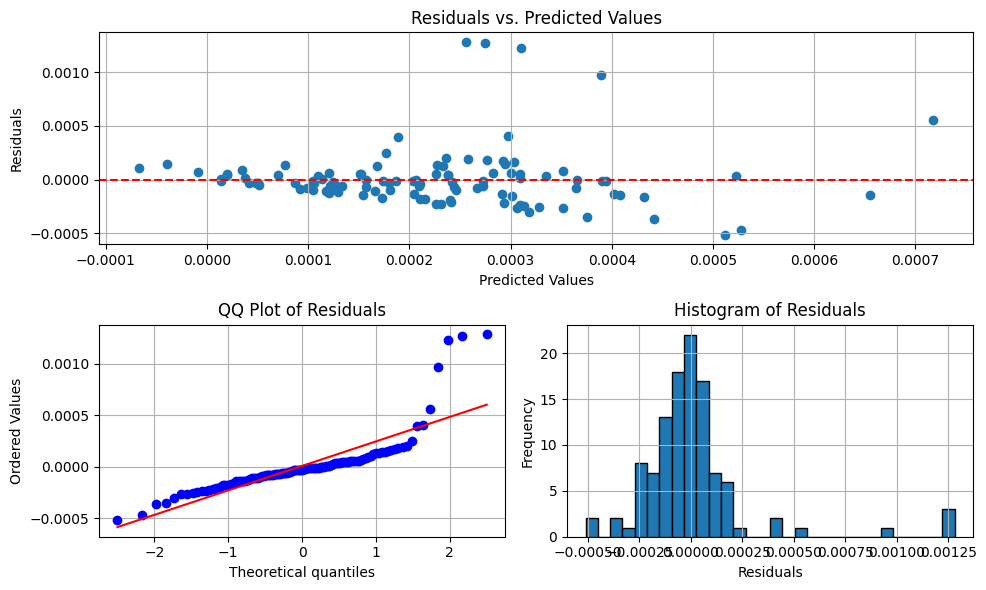

In [45]:
residuals(y_test, y_pred)